In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd
# data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
df_train = pd.read_csv(r'C:\Hoc_May\TH_HocMay\Paitients_Files_Train.csv')
df_train.head()

,ID,PRG,PL,PR,SK,TS,M11,BD2,Age,Insurance,Sepssis
0,ICU200010,6,148,72,35,0,33.6,0.627,50,0,Positive
1,ICU200011,1,85,66,29,0,26.6,0.351,31,0,Negative
2,ICU200012,8,183,64,0,0,23.3,0.672,32,1,Positive
3,ICU200013,1,89,66,23,94,28.1,0.167,21,1,Negative
4,ICU200014,0,137,40,35,168,43.1,2.288,33,1,Positive


In [3]:
df_train['sepsis_encoded'] = df_train['Sepssis'].map({'Positive':1, 'Negative': 0})
df_train.head()

,ID,PRG,PL,PR,SK,TS,M11,BD2,Age,Insurance,Sepssis,sepsis_encoded
0,ICU200010,6,148,72,35,0,33.6,0.627,50,0,Positive,1
1,ICU200011,1,85,66,29,0,26.6,0.351,31,0,Negative,0
2,ICU200012,8,183,64,0,0,23.3,0.672,32,1,Positive,1
3,ICU200013,1,89,66,23,94,28.1,0.167,21,1,Negative,0
4,ICU200014,0,137,40,35,168,43.1,2.288,33,1,Positive,1


In [4]:
df_train = df_train.drop(['ID', 'Sepssis'], axis='columns')
df_train.head()

,PRG,PL,PR,SK,TS,M11,BD2,Age,Insurance,sepsis_encoded
0,6,148,72,35,0,33.6,0.627,50,0,1
1,1,85,66,29,0,26.6,0.351,31,0,0
2,8,183,64,0,0,23.3,0.672,32,1,1
3,1,89,66,23,94,28.1,0.167,21,1,0
4,0,137,40,35,168,43.1,2.288,33,1,1


In [5]:
df_train.describe(include='all')

,PRG,PL,PR,SK,TS,M11,BD2,Age,Insurance,sepsis_encoded
count,599.000000,599.000000,599.000000,599.000000,599.000000,599.000000,599.000000,599.000000,599.000000,599.000000
mean,3.824708,120.153589,68.732888,20.562604,79.460768,31.920033,0.481187,33.290484,0.686144,0.347245
std,3.362839,32.682364,19.335675,16.017622,116.576176,8.008227,0.337552,11.828446,0.464447,0.476492
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000,0.000000
25%,1.000000,99.000000,64.000000,0.000000,0.000000,27.100000,0.248000,24.000000,0.000000,0.000000
50%,3.000000,116.000000,70.000000,23.000000,36.000000,32.000000,0.383000,29.000000,1.000000,0.000000
75%,6.000000,140.000000,80.000000,32.000000,123.500000,36.550000,0.647000,40.000000,1.000000,1.000000
max,17.000000,198.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000,1.000000


In [6]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

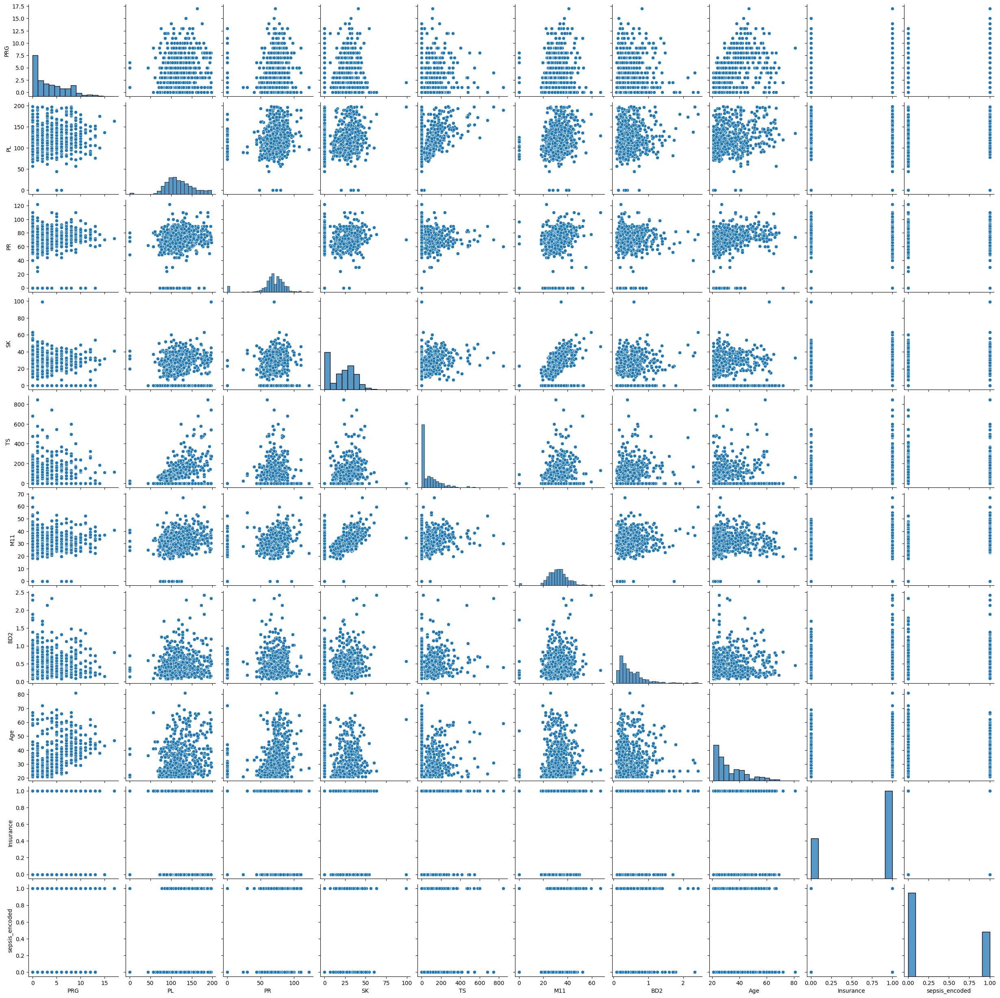

In [7]:
sns.pairplot(df_train)

<Axes: >

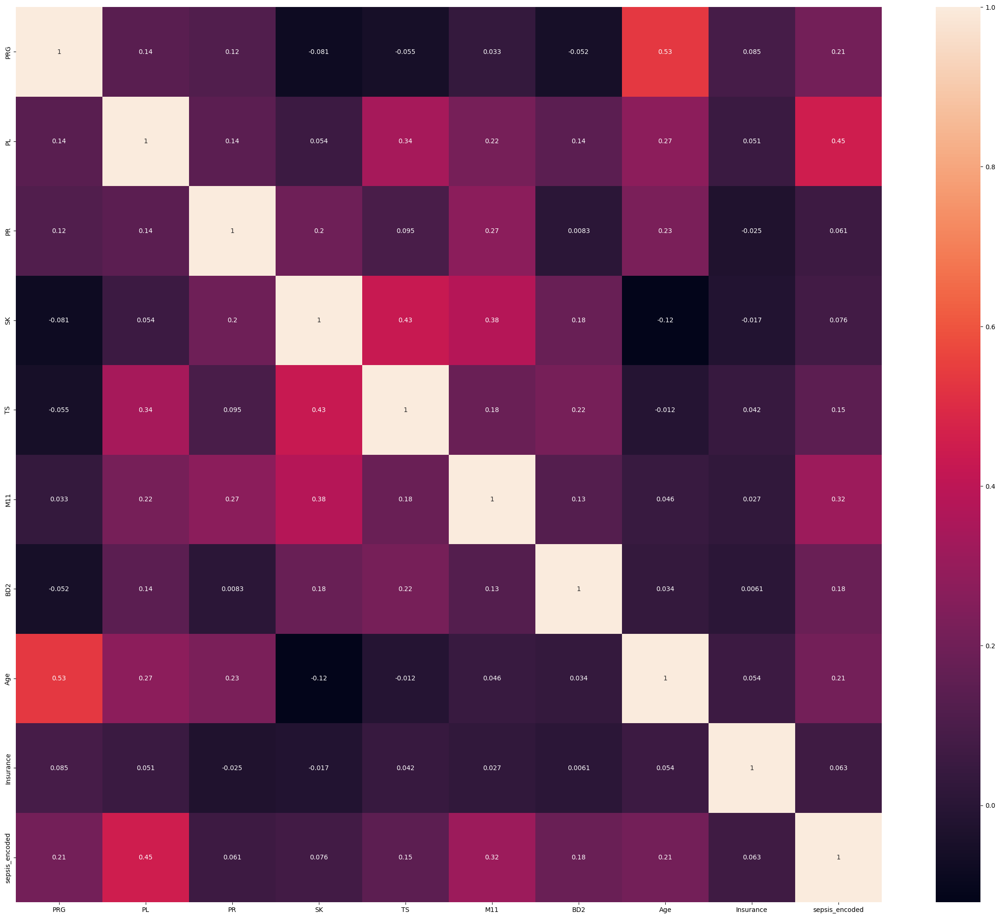

In [8]:
plt.figure(figsize=(30,25))
sns.heatmap(df_train.corr(), annot=True)

In [9]:
X = df_train.drop('sepsis_encoded', axis='columns')
y = df_train['sepsis_encoded']

In [10]:
y.value_counts()

sepsis_encoded
0    391
1    208
Name: count, dtype: int64

In [11]:
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.preprocessing import MinMaxScaler
from sklearn.utils.class_weight import compute_class_weight

In [12]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=2023)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((479, 9), (120, 9), (479,), (120,))

In [13]:
class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(y_train), y=y_train)
class_weights

array([0.76517572, 1.44277108])

In [14]:
class_weight_dict = {}
for idx, weight in enumerate(class_weights):
    class_weight_dict[idx] = weight
class_weight_dict

{0: 0.7651757188498403, 1: 1.4427710843373494}

In [15]:
scaler = MinMaxScaler()

In [19]:
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [20]:
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.naive_bayes import GaussianNB, BernoulliNB, MultinomialNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier

In [21]:
models = {
    'Logistic Regression': LogisticRegression(max_iter=10000000000, class_weight=class_weight_dict),
    'SGD Classifier': SGDClassifier(class_weight=class_weight_dict),
    'Random Forest': RandomForestClassifier(class_weight=class_weight_dict),
    'Gradient Boosting': GradientBoostingClassifier(),
    'GaussianNB': GaussianNB(),
    'MultinomialNB': MultinomialNB(),
    'KNeighbors': KNeighborsClassifier(),
    'Neural Network': MLPClassifier(max_iter=10000000),
    'XGB': XGBClassifier()
}
models

{'Logistic Regression': LogisticRegression(class_weight={0: 0.7651757188498403, 1: 1.4427710843373494},
                    max_iter=10000000000),
 'SGD Classifier': SGDClassifier(class_weight={0: 0.7651757188498403, 1: 1.4427710843373494}),
 'Random Forest': RandomForestClassifier(class_weight={0: 0.7651757188498403,
                                      1: 1.4427710843373494}),
 'Gradient Boosting': GradientBoostingClassifier(),
 'GaussianNB': GaussianNB(),
 'MultinomialNB': MultinomialNB(),
 'KNeighbors': KNeighborsClassifier(),
 'Neural Network': MLPClassifier(max_iter=10000000),
 'XGB': XGBClassifier(base_score=None, booster=None, callbacks=None,
               colsample_bylevel=None, colsample_bynode=None,
               colsample_bytree=None, early_stopping_rounds=None,
               enable_categorical=False, eval_metric=None, feature_types=None,
               gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
               interaction_constraints=None, learning

In [22]:
model_names = []
model_average_scores = []
for model_name, model in models.items():
    scores = cross_val_score(model, X_train_scaled, y_train)
    model_names.append(model_name)
    model_average_scores.append(scores.mean())
    print(f'Scoring completed for {model_name}')

Scoring completed for Logistic Regression
Scoring completed for SGD Classifier
Scoring completed for Random Forest
Scoring completed for Gradient Boosting
Scoring completed for GaussianNB
Scoring completed for MultinomialNB
Scoring completed for KNeighbors
Scoring completed for Neural Network
Scoring completed for XGB


In [23]:
df_model = pd.DataFrame()
df_model['model'] = model_names
df_model['average score'] = model_average_scores
df_model

,model,average score
0,Logistic Regression,0.730636
1,SGD Classifier,0.688969
2,Random Forest,0.747390
3,Gradient Boosting,0.753640
4,GaussianNB,0.749430
5,MultinomialNB,0.653443
6,KNeighbors,0.695329
7,Neural Network,0.743224
8,XGB,0.728575


In [24]:
optimizer = GridSearchCV(GradientBoostingClassifier(), {
    'loss': ['deviance', 'exponential'],
    'learning_rate': [0.05, 0.1, 0.5],
    'n_estimators': [50, 100, 150, 200],
    'criterion': ['friedman_mse', 'squared_error'],
    'max_features': ['auto', 'sqrt', 'log2', None]
})

In [25]:
optimizer.fit(X_train_scaled, y_train)
print('Optimizing complete')

C:\Users\Admin\AppData\Roaming\Python\Python311\site-packages\sklearn\ensemble\_gb.py:280: FutureWarning: The loss parameter name 'deviance' was deprecated in v1.1 and will be removed in version 1.3. Use the new parameter name 'log_loss' which is equivalent.
  warnings.warn(
C:\Users\Admin\AppData\Roaming\Python\Python311\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
C:\Users\Admin\AppData\Roaming\Python\Python311\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0'`.
  warnings.warn(
C:\Users\Admin\AppData\Roaming\Python\Python311\site-packages\sklearn\tree\_classes.py:277: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep th

Optimizing complete


In [26]:
df_optimizer = pd.DataFrame(optimizer.cv_results_).dropna()
df_optimizer[['param_loss', 'param_learning_rate', 'param_n_estimators', 'param_criterion', 'param_max_features', 'mean_test_score']]

,param_loss,param_learning_rate,param_n_estimators,param_criterion,param_max_features,mean_test_score
0,deviance,0.05,50,friedman_mse,auto,0.749474
1,deviance,0.05,100,friedman_mse,auto,0.768268
2,deviance,0.05,150,friedman_mse,auto,0.770329
3,deviance,0.05,200,friedman_mse,auto,0.761996
4,deviance,0.05,50,friedman_mse,sqrt,0.749496
...,...,...,...,...,...,...
183,exponential,0.5,200,squared_error,sqrt,0.741075
184,exponential,0.5,50,squared_error,log2,0.736996
185,exponential,0.5,100,squared_error,log2,0.730680
186,exponential,0.5,150,squared_error,log2,0.728596


In [27]:
optimizer.best_params_, optimizer.best_score_

({'criterion': 'friedman_mse',
  'learning_rate': 0.05,
  'loss': 'exponential',
  'max_features': 'log2',
  'n_estimators': 150},
 0.7744736842105264)

In [28]:
best_params = optimizer.best_params_

In [29]:
final_model = GradientBoostingClassifier(criterion=best_params['criterion'], 
                                         learning_rate=best_params['learning_rate'], loss=best_params['loss'], 
                                         max_features=best_params['max_features'], n_estimators=best_params['n_estimators'])

In [30]:
final_model.fit(X_train_scaled, y_train)

GradientBoostingClassifier(learning_rate=0.05, loss='exponential',
                           max_features='log2', n_estimators=150)

In [31]:
from sklearn.metrics import classification_report

In [32]:
y_predicted = final_model.predict(X_test_scaled)

In [33]:
print(classification_report(y_test, y_predicted))

              precision    recall  f1-score   support

           0       0.79      0.85      0.81        78
           1       0.67      0.57      0.62        42

    accuracy                           0.75       120
   macro avg       0.73      0.71      0.72       120
weighted avg       0.74      0.75      0.75       120



In [34]:
df_unknown = pd.read_csv(r'C:\Hoc_May\TH_HocMay\Paitients_Files_Test.csv')
df_unknown.head(169)

,ID,PRG,PL,PR,SK,TS,M11,BD2,Age,Insurance
0,ICU200609,1,109,38,18,120,23.1,0.407,26,1
1,ICU200610,1,108,88,19,0,27.1,0.400,24,1
2,ICU200611,6,96,0,0,0,23.7,0.190,28,1
3,ICU200612,1,124,74,36,0,27.8,0.100,30,1
4,ICU200613,7,150,78,29,126,35.2,0.692,54,0
...,...,...,...,...,...,...,...,...,...,...
164,ICU200773,10,101,76,48,180,32.9,0.171,63,1
165,ICU200774,2,122,70,27,0,36.8,0.340,27,1
166,ICU200775,5,121,72,23,112,26.2,0.245,30,1
167,ICU200776,1,126,60,0,0,30.1,0.349,47,1


In [35]:
X_unknown = df_unknown.drop('ID', axis='columns')

In [36]:
X_unknown_scaled = scaler.transform(X_unknown)

In [37]:
y_unknown = final_model.predict(X_unknown_scaled)

In [38]:
df_unknown['predicted_sepsis'] = y_unknown
df_unknown.head(5)

,ID,PRG,PL,PR,SK,TS,M11,BD2,Age,Insurance,predicted_sepsis
0,ICU200609,1,109,38,18,120,23.1,0.407,26,1,0
1,ICU200610,1,108,88,19,0,27.1,0.400,24,1,0
2,ICU200611,6,96,0,0,0,23.7,0.190,28,1,0
3,ICU200612,1,124,74,36,0,27.8,0.100,30,1,0
4,ICU200613,7,150,78,29,126,35.2,0.692,54,0,1


In [39]:
df_unknown.to_csv('prediction.csv', index=False)

In [40]:
from sklearn.metrics import accuracy_score, mean_squared_error

# Độ chính xác của mô hình trên tập kiểm tra
accuracy = accuracy_score(y_test, y_predicted)
print(f"Độ chính xác của mô hình trên tập kiểm tra: {accuracy}")

# Sai số của mô hình trên tập kiểm tra
mse = mean_squared_error(y_test, y_predicted)
print(f"Sai số của mô hình trên tập kiểm tra: {mse}")

Độ chính xác của mô hình trên tập kiểm tra: 0.75
Sai số của mô hình trên tập kiểm tra: 0.25


In [41]:
import tkinter as tk
from tkinter import ttk
from sklearn.metrics import accuracy_score, mean_squared_error

def classify_patient():
    input_data = [
        float(entry_prg.get()),
        float(entry_pl.get()),
        float(entry_pr.get()),
        float(entry_sk.get()),
        float(entry_ts.get()),
        float(entry_m11.get()),
        float(entry_bd2.get()),
        int(entry_age.get()),
        int(entry_insurance.get())
    ]

    # Chuẩn hóa dữ liệu đầu vào
    input_data_scaled = scaler.transform([input_data])

    # Chẩn đoán bệnh
    prediction = final_model.predict(input_data_scaled)

    # Hiển thị kết quả chẩn đoán
    if prediction == 1:
        result_label.configure(text="Bị bịnh nhiễm trùng huyết rồi")
    else:
        result_label.configure(text="Còn tươi lắm chưa bịnh")

    # Tính độ chính xác và sai số
    y_predicted = final_model.predict(X_test_scaled)
    accuracy = accuracy_score(y_test, y_predicted)
    mse = mean_squared_error(y_test, y_predicted)
    
    # Hiển thị độ chính xác và sai số lên giao diện
    accuracy_label.configure(text=f"Độ chính xác: {accuracy}")
    mse_label.configure(text=f"Sai số: {mse}")

# Tạo giao diện người dùng
root = tk.Tk()
root.title("Bệnh nhiễm trùng máu - Chẩn đoán bệnh")
root.geometry("400x550")
root.resizable(False, False)

# Giao diện người dùng
frame = ttk.Frame(root, padding="20")
frame.grid(row=0, column=0, sticky="nsew")

label_prg = ttk.Label(frame, text="PRG:")
label_prg.grid(row=0, column=0, sticky="w")
entry_prg = ttk.Entry(frame)
entry_prg.grid(row=0, column=1, padx=5, pady=5)

label_pl = ttk.Label(frame, text="PL:")
label_pl.grid(row=1, column=0, sticky="w")
entry_pl = ttk.Entry(frame)
entry_pl.grid(row=1, column=1, padx=5, pady=5)

label_pr = ttk.Label(frame, text="PR:")
label_pr.grid(row=2, column=0, sticky="w")
entry_pr = ttk.Entry(frame)
entry_pr.grid(row=2, column=1, padx=5, pady=5)

label_sk = ttk.Label(frame, text="SK:")
label_sk.grid(row=3, column=0, sticky="w")
entry_sk = ttk.Entry(frame)
entry_sk.grid(row=3, column=1, padx=5, pady=5)

label_ts = ttk.Label(frame, text="TS:")
label_ts.grid(row=4, column=0, sticky="w")
entry_ts = ttk.Entry(frame)
entry_ts.grid(row=4, column=1, padx=5, pady=5)

label_m11 = ttk.Label(frame, text="M11:")
label_m11.grid(row=5, column=0, sticky="w")
entry_m11 = ttk.Entry(frame)
entry_m11.grid(row=5, column=1, padx=5, pady=5)

label_bd2 = ttk.Label(frame, text="BD2:")
label_bd2.grid(row=6, column=0, sticky="w")
entry_bd2 = ttk.Entry(frame)
entry_bd2.grid(row=6, column=1, padx=5, pady=5)

label_age = ttk.Label(frame, text="Age:")
label_age.grid(row=7, column=0, sticky="w")
entry_age = ttk.Entry(frame)
entry_age.grid(row=7, column=1, padx=5, pady=5)

label_insurance = ttk.Label(frame, text="Insurance:")
label_insurance.grid(row=8, column=0, sticky="w")
entry_insurance = ttk.Entry(frame)
entry_insurance.grid(row=8, column=1, padx=5, pady=5)

classify_button = ttk.Button(frame, text="Chẩn đoán", command=classify_patient)
classify_button.grid(row=9, column=0, columnspan=2, pady=10)

result_label = ttk.Label(frame, text="")
result_label.grid(row=10, column=0, columnspan=2)

accuracy_label = ttk.Label(frame, text="")
accuracy_label.grid(row=11, column=0, columnspan=2)

mse_label = ttk.Label(frame, text="")
mse_label.grid(row=12, column=0, columnspan=2)

root.mainloop()


In [61]:
import pyodbc

print(pyodbc.drivers())
connection = pyodbc.connect(
    "Driver={ODBC Driver 17 for SQL Server};"
    "Server=DESKTOP-O5U1LHH\SQLEXPRESS;"
    "Database=QL_BENHNHAN;"
    "uid=sa;"
    "pwd=123;"
)


['SQL Server', 'Microsoft Access Driver (*.mdb, *.accdb)', 'Microsoft Excel Driver (*.xls, *.xlsx, *.xlsm, *.xlsb)', 'Microsoft Access Text Driver (*.txt, *.csv)', 'SQL Server Native Client RDA 11.0', 'ODBC Driver 17 for SQL Server', 'Oracle in OraDB21Home1', 'SQL Anywhere 17']


In [62]:
import tkinter as tk
from tkinter import ttk
import pyodbc
from sklearn.metrics import accuracy_score, mean_squared_error

# Kết nối đến cơ sở dữ liệu SQL Server
connection = pyodbc.connect(
    "Driver={ODBC Driver 17 for SQL Server};"
    "Server=DESKTOP-O5U1LHH\SQLEXPRESS;"
    "Database=QL_BENHNHAN;"
    "uid=sa;"
    "pwd=123;"
)

def classify_patient():
    input_data = [
        
        float(entry_prg.get()),
        float(entry_pl.get()),
        float(entry_pr.get()),
        float(entry_sk.get()),
        float(entry_ts.get()),
        float(entry_m11.get()),
        float(entry_bd2.get()),
        int(entry_age.get()),
        int(entry_insurance.get())
    ]

    # Chuẩn hóa dữ liệu đầu vào
    input_data_scaled = scaler.transform([input_data])

    # Chẩn đoán bệnh
    prediction = final_model.predict(input_data_scaled)


    # Hiển thị kết quả chẩn đoán
    if prediction == 1:
        result_label.configure(text="Bị bịnh nhiễm trùng huyết rồi")
    else:
        result_label.configure(text="Còn tươi lắm chưa bịnh")

    # Lưu thông tin bệnh nhân nếu dự đoán là bệnh
    if prediction == 1:
        cursor = connection.cursor()
        cursor.execute(
            "INSERT INTO TT_NGBENH (ID, RPG, PL, PR, SK, TS, M11, BD2, AGE, INSURANCE) "
            "VALUES (?, ?, ?, ?, ?, ?, ?, ?, ?, ?)",
            (
                entry_id.get(),
                entry_prg.get(),
                entry_pl.get(),
                entry_pr.get(),
                entry_sk.get(),
                entry_ts.get(),
                entry_m11.get(),
                entry_bd2.get(),
                entry_age.get(),
                entry_insurance.get(),
            ),
        )
        connection.commit()


    # Tính độ chính xác và sai số
    y_predicted = final_model.predict(X_test_scaled)
    accuracy = accuracy_score(y_test, y_predicted)
    mse = mean_squared_error(y_test, y_predicted)
    
    # Hiển thị độ chính xác và sai số lên giao diện
    accuracy_label.configure(text=f"Độ chính xác: {accuracy:.2f}")
    mse_label.configure(text=f"Sai số: {mse:.2f}")

# Tạo giao diện người dùng
root = tk.Tk()
root.title("Bệnh nhiễm trùng máu - Chẩn đoán bệnh")
root.geometry("400x600")
root.resizable(False, False)

# Tạo font chữ
font_title = ("Helvetica", 16, "bold")
font_label = ("Helvetica", 12)
font_result = ("Helvetica", 14, "bold")

# Giao diện người dùng
frame = ttk.Frame(root, padding="20")
frame.grid(row=0, column=0, sticky="nsew")

label_title = ttk.Label(frame, text="Chẩn đoán bệnh nhiễm trùng máu", font=font_title)
label_title.grid(row=0, column=0, columnspan=2, pady=10)

label_id = ttk.Label(frame, text="ID:", font=font_label)
label_id.grid(row=1, column=0, sticky="w")
entry_id = ttk.Entry(frame)
entry_id.grid(row=1, column=1, padx=5, pady=5)

label_prg = ttk.Label(frame, text="PRG:", font=font_label)
label_prg.grid(row=2, column=0, sticky="w")
entry_prg = ttk.Entry(frame)
entry_prg.grid(row=2, column=1, padx=5, pady=5)

label_pl = ttk.Label(frame, text="PL:", font=font_label)
label_pl.grid(row=3, column=0, sticky="w")
entry_pl = ttk.Entry(frame)
entry_pl.grid(row=3, column=1, padx=5, pady=5)

label_pr = ttk.Label(frame, text="PR:", font=font_label)
label_pr.grid(row=4, column=0, sticky="w")
entry_pr = ttk.Entry(frame)
entry_pr.grid(row=4, column=1, padx=5, pady=5)

label_sk = ttk.Label(frame, text="SK:", font=font_label)
label_sk.grid(row=5, column=0, sticky="w")
entry_sk = ttk.Entry(frame)
entry_sk.grid(row=5, column=1, padx=5, pady=5)

label_ts = ttk.Label(frame, text="TS:", font=font_label)
label_ts.grid(row=6, column=0, sticky="w")
entry_ts = ttk.Entry(frame)
entry_ts.grid(row=6, column=1, padx=5, pady=5)

label_m11 = ttk.Label(frame, text="M11:", font=font_label)
label_m11.grid(row=7, column=0, sticky="w")
entry_m11 = ttk.Entry(frame)
entry_m11.grid(row=7, column=1, padx=5, pady=5)

label_bd2 = ttk.Label(frame, text="BD2:", font=font_label)
label_bd2.grid(row=8, column=0, sticky="w")
entry_bd2 = ttk.Entry(frame)
entry_bd2.grid(row=8, column=1, padx=5, pady=5)

label_age = ttk.Label(frame, text="Age:", font=font_label)
label_age.grid(row=9, column=0, sticky="w")
entry_age = ttk.Entry(frame)
entry_age.grid(row=9, column=1, padx=5, pady=5)

label_insurance = ttk.Label(frame, text="Insurance:", font=font_label)
label_insurance.grid(row=10, column=0, sticky="w")
entry_insurance = ttk.Entry(frame)
entry_insurance.grid(row=10, column=1, padx=5, pady=5)

classify_button = ttk.Button(frame, text="Chẩn đoán", command=classify_patient)
classify_button.grid(row=11, column=0, columnspan=2, pady=10)

result_label = ttk.Label(frame, text="", font=font_result)
result_label.grid(row=12, column=0, columnspan=2)

accuracy_label = ttk.Label(frame, text="", font=font_label)
accuracy_label.grid(row=13, column=0, columnspan=2)

mse_label = ttk.Label(frame, text="", font=font_label)
mse_label.grid(row=14, column=0, columnspan=2)

root.mainloop()


C:\Users\Admin\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
